# Oregon Wildlife - Image Classification Capstone
## David Lappin
### BrainStation
#### 3/1/2023 -

# temp sources of info:

multilabel classification
https://www.analyticsvidhya.com/blog/2019/04/build-first-multi-label-image-classification-model-python/

regularization and optomization strategies in image classification CNN
https://heartbeat.comet.ml/regularization-techniques-for-image-processing-using-tensorflow-56c5b365bc17

# Introduction and Purpose

Fill in all the cool stuff for introduction later

# Table of Contents

Fill in all the cool stuff for the TOC later

# Packages Import

**Matplotlib** - Used as needed for basic visualizations

**Numpy** - Supports large, multi-dimensional arrays and matrices,and contains a large collection of high-level mathematical functions to operate on these arrays.

**PIL** - Python Imaging Library. Original support for python to deal with images

**OS** - interaction with the native OS Python (used for establishing relative path to data files)

**Tensorflow** - Machine learning and artificial intelligence with particular focus on training and inference of deep neural networks

**Keras** - Application Program interface (API) built on tensorflow. Used for implementing neural networks (supports backend computation in tensor flow up to 2.3)

                           

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL 
from glob import glob

import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# Data Import

Set relative path to data and explore some of the data within

In [2]:
#set local path to files for basic exploration

datapath = 'data/oregon_wildlife/' # This is the relative path to the data
image_files = os.listdir(datapath) #these are the individual folder names (the class names)

In [4]:
#shows the class names and the total number of classes in data set (20)
print(f'Total number of classes: {len(image_files)}\n\nClass Names: \n\n{image_files}')

Total number of classes: 20

Class Names: 

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'seals', 'sea_lions', 'virginia_opossum']


In [5]:
totalcount = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife/{file}/*')))
    totalcount.append(count)
    print(f'{count}: {file}')
    
print(f'Total images: {sum(totalcount)}')

743: bald_eagle
715: black_bear
690: bobcat
713: canada_lynx
735: columbian_black-tailed_deer
673: cougar
736: coyote
763: deer
660: elk
668: gray_fox
730: gray_wolf
575: mountain_beaver
691: nutria
724: raccoon
650: raven
757: red_fox
581: ringtail
695: seals
725: sea_lions
726: virginia_opossum
Total images: 13950


There are 14012 files in the sub folders. Now lets check what types of data they are.

In [6]:
#how many jpg files?

jpg_count = len(list(glob('data/oregon_wildlife/**/*.jpg')))
print(jpg_count)

13157


Note that the number of .jpg type files is not equal to the total image files. Checked what other types are in the images and created a list of those file types to check if they add up to the total file types (14012).

In [44]:
#determine how many of each file type there are in the directory

filetypes = ['gif', 'png', 'bmp', 'jpeg', 'jpg'] #determined what file types there where by looking a the directory properties
filetypescounts = [] #stores the counts

for ftype in filetypes:
    count = len(list(glob(f'data/oregon_wildlife/**/*.{ftype}')))
    filetypescounts.append(count)
    
print(f'Counts by file type: {filetypescounts}') #prints the total counts
print(f'Total of: {sum(filetypescounts)} files (this matches)') #prints the sum total of the counts
print(f'There are: {sum(filetypescounts) - len(jpg_count)} non ".jpg" files') # prints non jpg file type count


Counts by file type: [58, 508, 4, 285, 13157]
Total of: 14012 files (this matches)
There are: 855 non ".jpg" files


# Look at some of the Images
Look at a few of the class folders and the images inside them

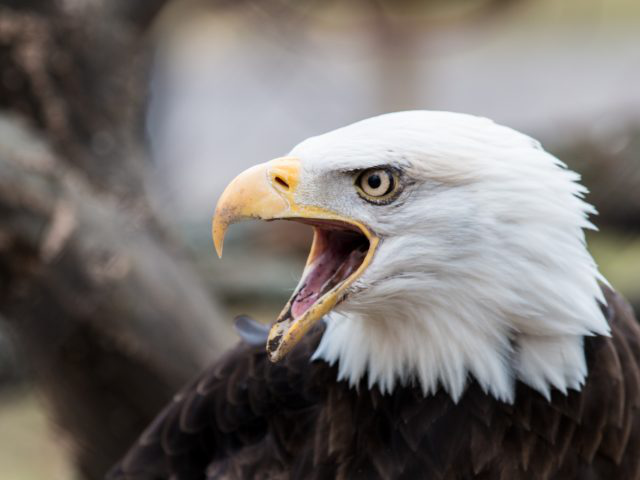

In [45]:
bald_eagle = list(glob(datapath+'bald_eagle/*'))
PIL.Image.open(str(bald_eagle[0]))

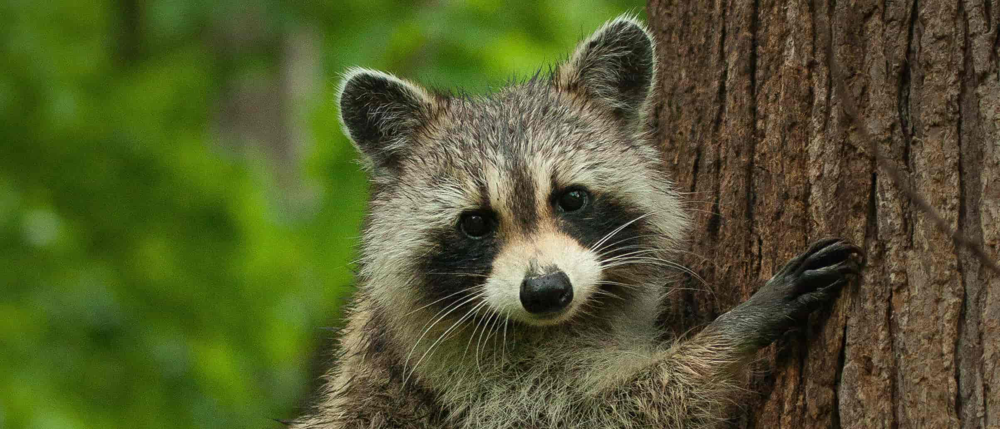

In [46]:
raccoon = list(glob(datapath+'raccoon/*'))
PIL.Image.open(str(raccoon[1]))

### Observations
Note that the photos below are not resized and they are not uniform in dimensions:
<a id='dimcompar'></a>

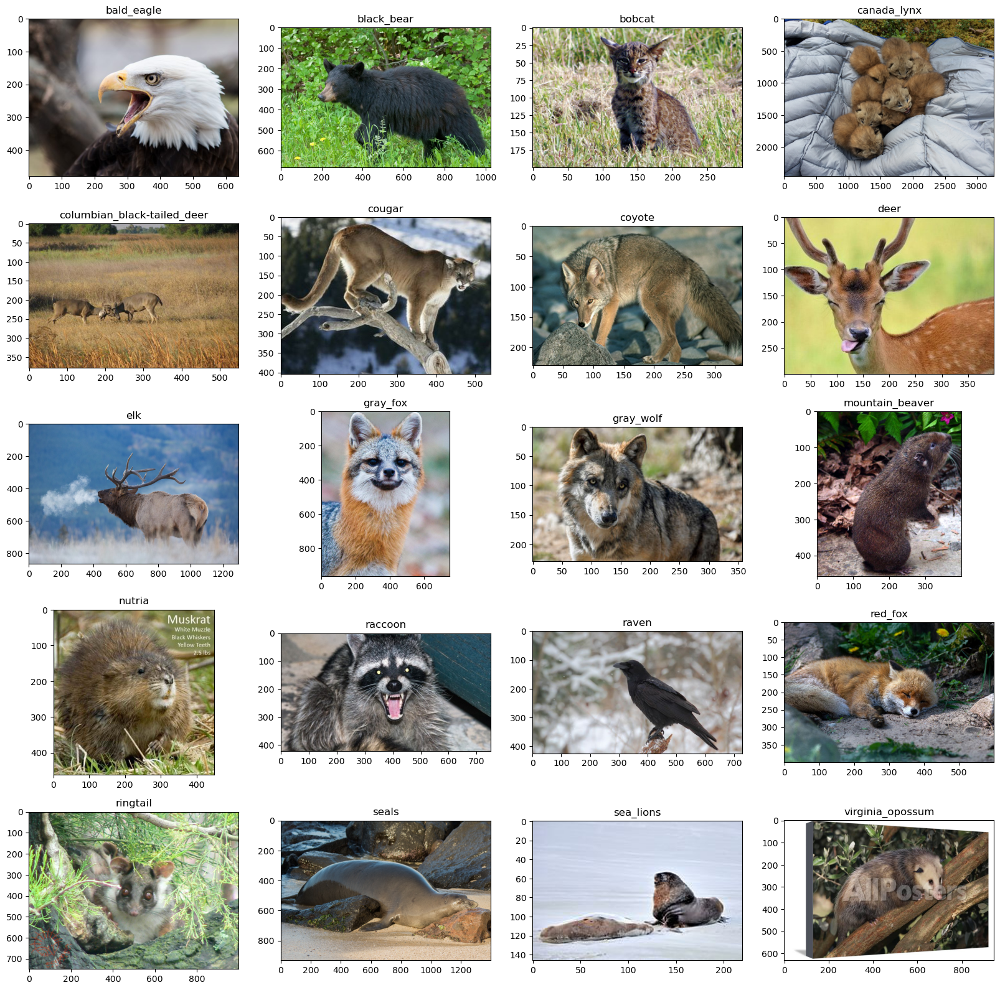

In [47]:
#shows one of each class of species in the main directory

speciesfigures=plt.figure(figsize =(20, 20))
n=0

for species in image_files:
    n+=1
    animals = list(glob(f'data/oregon_wildlife/{species}/*.*'))
    img = PIL.Image.open(str(animals[0]))
    speciesfigures.add_subplot(5, 4, n)
    plt.imshow(img)
    plt.title(species)
       

### Different File Extensions
Look at some different file extensions:

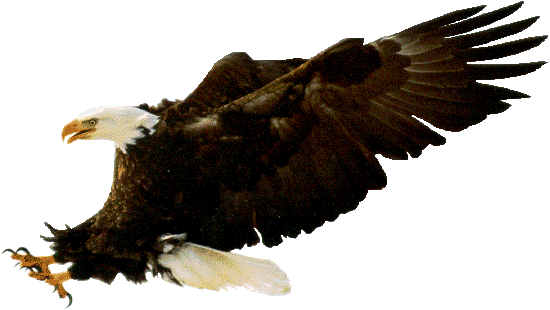

In [21]:
gifeagle = list(glob(datapath+'bald_eagle/*.gif'))
PIL.Image.open(str(gifeagle[0]))

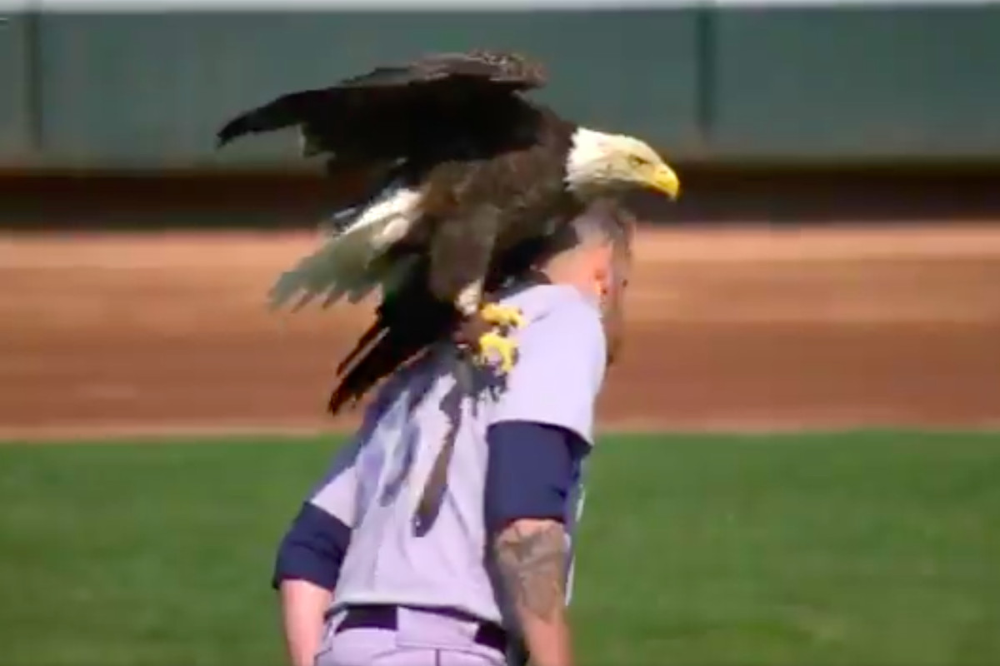

In [22]:
pngeagle = list(glob(datapath+'bald_eagle/*.png'))
PIL.Image.open(str(pngeagle[0]))

Look at all relevent extension types to make sure they open properly:

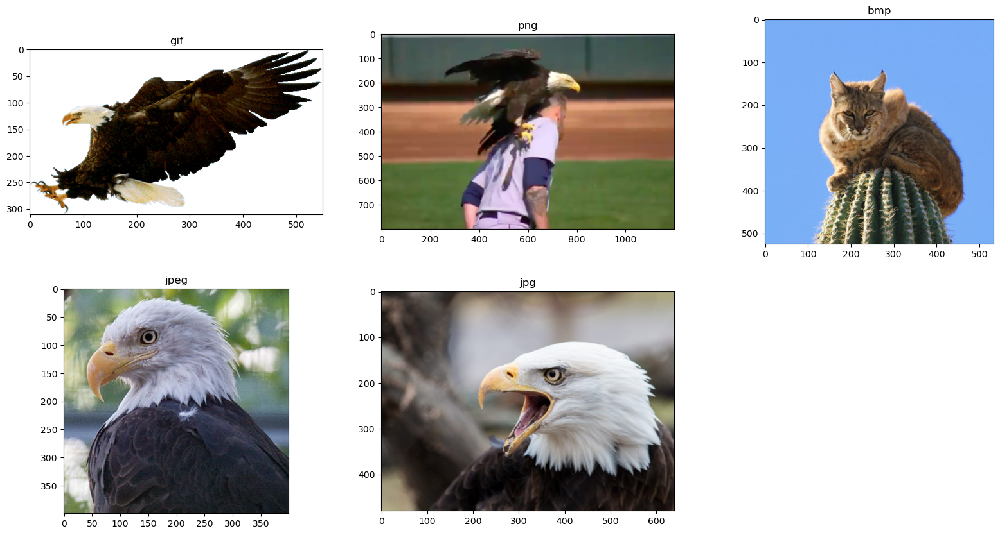

In [48]:
#check to see if all of the file extension types open correctly

filetypes = ('gif', 'png', 'bmp', 'jpeg', 'jpg') #determined what file types there where by looking a the directory properties

datatypefigures=plt.figure(figsize =(20, 10))
n=0
for i in filetypes:
    n+=1
    image = list(glob(f'data/oregon_wildlife/*/*.{i}'))
    plot_img = PIL.Image.open(str(image[0]))
    datatypefigures.add_subplot(2, 3, n)
    plt.imshow(plot_img)
    plt.title(i)

source may help for creating df from subfolders in main directory and resizing/scaling image imports
https://medium.com/mlearning-ai/image-classification-for-beginner-a6de7a69bc78

# Import and Split Dataframe

In [49]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [50]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 14012 files belonging to 20 classes.
Using 11210 files for training.


In [52]:
#confirm that all 20 classes are present in the training set

print(train_set.class_names)
print("")
print(f' There are still {len(train_set.class_names)} classes in the training data')

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'sea_lions', 'seals', 'virginia_opossum']

 There are still 20 classes in the training data


In [53]:
test_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 14012 files belonging to 20 classes.
Using 2802 files for validation.


In [55]:
#confirm that all 20 classes are present in the training set

print(test_set.class_names)
print("")
print(f' There are still {len(test_set.class_names)} classes in the testing data')

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'sea_lions', 'seals', 'virginia_opossum']

 There are still 20 classes in the testing data


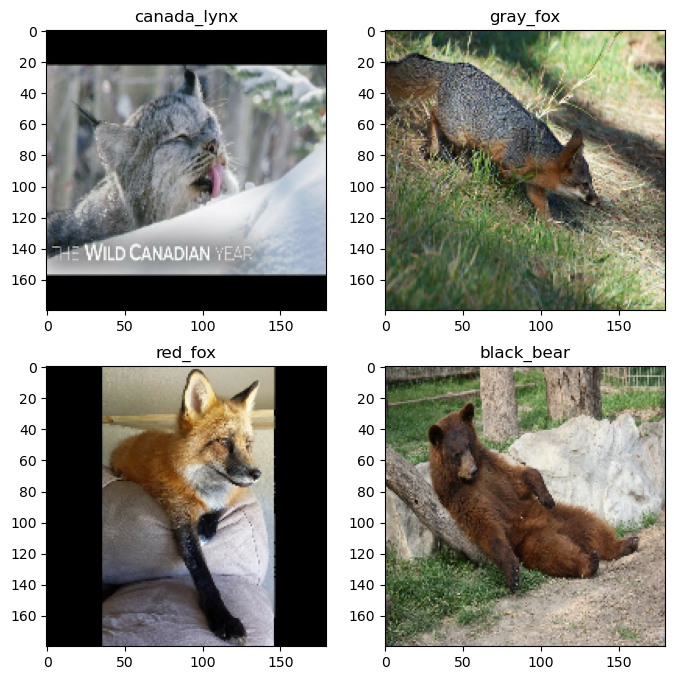

In [56]:
#plot the images to show that the sizes have been standardized in the new test/train sets

class_names = test_set.class_names

plt.figure(figsize=(8, 8))
for images, labels in train_set.take(1):
  for i in range(4):
    ax = plt.subplot(2, 2, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    #plt.axis("off")

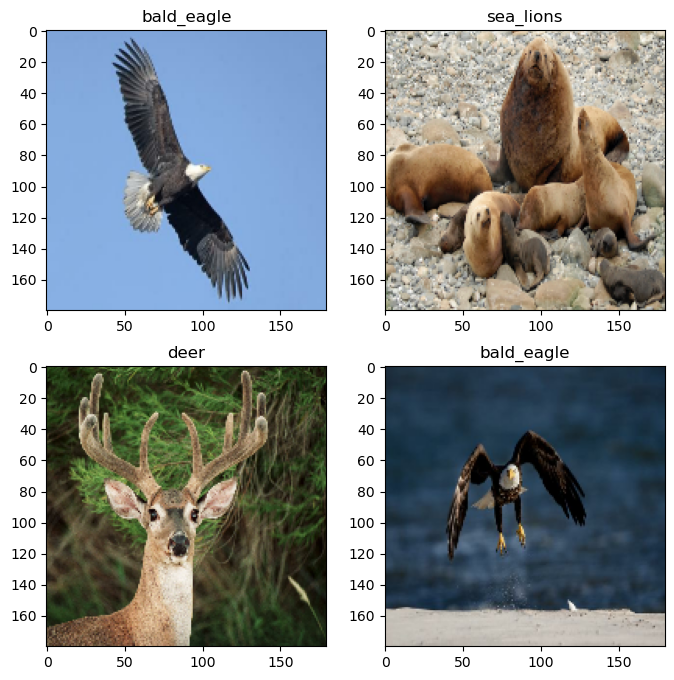

In [57]:
#plot the images to show that the sizes have been standardized in the new test/train sets

class_names = test_set.class_names

plt.figure(figsize=(8, 8))
for images, labels in test_set.take(1):
  for i in range(4):
    ax = plt.subplot(2, 2, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    #plt.axis("off")

### Observations:

The photos/information above indicate that the data was evenly split between the classes. All 20 classes are represented in both the training and the testing data sets. Additionally the images are resized to be uniform (180x180). This can be [compared to the initial](#dimcompar) exploration where the sizes of the photos were not uniform.

In [58]:
#shows the shape and dimensions in the trianing set images

for image_batch, labels_batch in train_set:
  print(image_batch.shape)
  print(labels_batch.shape)
  break


(32, 180, 180, 3)
(32,)


In [59]:
#shows the shape and dimensions in the trianing set images

for image_batch, labels_batch in test_set:
  print(image_batch.shape)
  print(labels_batch.shape)
  break


(32, 180, 180, 3)
(32,)


Each image in the training and test set is sized (180x180x3) with a batch size of 32 images per batch. The third dimension (3) corresponds to the RGB values in each image.

In [60]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
test_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


As noted above:
- **Autotune** allows for CPU performance optimizaiton
- **Cache** - stores imported images in memory for future epoch iterations
- **prefetch** - allows for overlapping of preprocess and training

In [61]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [62]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [63]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 45, 45, 64)       

In [64]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=test_set, 
  epochs=epochs            
)

Epoch 1/2


InvalidArgumentError: Graph execution error:

Input size should match (header_size + row_size * abs_height) but they differ by 2
	 [[{{node decode_image/DecodeImage}}]]
	 [[IteratorGetNext]] [Op:__inference_train_function_17174]

# Note:

There appears to be a sizing error. going to stepwise remove image extension types that are not .jpg. Will Start with .gif and see if the error persists.

In [73]:
#select and coutn all .gif files in the dir

rmgif = glob('data/oregon_wildlife/*/*.gif')
print(f'Example of file to be removed: {rmgif[1]}')
print(f'Total files to be removed = {len(rmgif)}')

Example of file to be removed: datanew/oregon_wildlife\bald_eagle\895e333ad4988ae8cf.gif
Total files to be removed = 58


### Warning - files to be removed from main directory in next kernel

In [75]:
#remove selected files
#THIS DELETES FILES FROM THE MAIN DIRECTORY

for i in rmgif:
    os.remove(i)

In [77]:
#determine how many of each file type there are in the directory

filetypes = ['gif', 'png', 'bmp', 'jpeg', 'jpg'] #determined what file types there where by looking a the directory properties
filetypescounts = [] #stores the counts

for ftype in filetypes:
    count = len(list(glob(f'data/oregon_wildlife/**/*.{ftype}')))
    filetypescounts.append(count)
    
print(f'Counts by file type: {filetypescounts}') #prints the total counts
print(f'Total of: {sum(filetypescounts)} files (this matches)') #prints the sum total of the counts
print(f'There are: {sum(filetypescounts) - len(jpg_count)} non ".jpg" files') # prints non jpg file type count

Counts by file type: [0, 508, 4, 285, 13157]
Total of: 13954 files (this matches)
There are: 797 non ".jpg" files


Note that there are now no .gif file types in the directory (all 58 instances have been deleted)

RE-Run model with no .gif types:

In [19]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [20]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 11160 files for training.


In [21]:
test_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 2790 files for validation.


In [22]:
class_names = train_set.class_names

In [23]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
test_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


In [24]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [25]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [26]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [27]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=test_set, 
  epochs=epochs            
)

Epoch 1/2
349/349 [==============================] - 127s 291ms/step - loss: 2.5818 - accuracy: 0.2126 - val_loss: 2.2298 - val_accuracy: 0.3265
Epoch 2/2
349/349 [==============================] - 94s 268ms/step - loss: 1.7886 - accuracy: 0.4721 - val_loss: 1.5757 - val_accuracy: 0.5477


# Note:

Removing .bmp files next

In [89]:
#select and coutn all .gif files in the dir

rmbmp = glob('data/oregon_wildlife/*/*.bmp')
print(f'Example of file to be removed: {rmbmp[1]}')
print(f'Total files to be removed = {len(rmbmp)}')

Example of file to be removed: datanew/oregon_wildlife\bobcat\5a6d6f8c9bb84082bd.bmp
Total files to be removed = 4


### Warning - files to be removed from main directory in next kernel

In [90]:
#remove selected files
#THIS DELETES FILES FROM THE MAIN DIRECTORY

for i in rmbmp:
    os.remove(i)

In [91]:
#determine how many of each file type there are in the directory

filetypes = ['gif', 'png', 'bmp', 'jpeg', 'jpg'] #determined what file types there where by looking a the directory properties
filetypescounts = [] #stores the counts

for ftype in filetypes:
    count = len(list(glob(f'data/oregon_wildlife/**/*.{ftype}')))
    filetypescounts.append(count)
    
print(f'Counts by file type: {filetypescounts}') #prints the total counts
print(f'Total of: {sum(filetypescounts)} files (this matches)') #prints the sum total of the counts
print(f'There are: {sum(filetypescounts) - len(jpg_count)} non ".jpg" files') # prints non jpg file type count

Counts by file type: [0, 508, 0, 285, 13157]
Total of: 13950 files (this matches)
There are: 793 non ".jpg" files


Note that there are now no .bmp file types in the directory (all 4 instances have been deleted)

RE-Run model with no .bmp types:

In [3]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [4]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 11160 files for training.


In [5]:
test_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 2790 files for validation.


In [6]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
test_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


As noted above:
- **Autotune** allows for CPU performance optimizaiton
- **Cache** - stores imported images in memory for future epoch iterations
- **prefetch** - allows for overlapping of preprocess and training

In [7]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


NameError: name 'class_names' is not defined

In [123]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [124]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [ ]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=test_set, 
  epochs=epochs            
)

## Observations

It appears that the .bmp files were incompatible. Per Keras source, the files should not have posed an issue, but multiple trials with them removed has allowed the model to progress. It is also unclear if the .gif files were creating an issue, but since they constitued such a small percentage (~.4%) of the data, we will leave them out of the remaining analysis as well.

## EDA Summary 

Since we have made a few changes to the data, we can re-load all the information and see how our data has changed before beginning our modelling.

# Re-compile and Re-Run Baseline Model 

Now that the formatting issues are sorted out we will recompile and re-run a baseline model with more 

In [127]:
#reset previous stored models and layers

tf.keras.backend.clear_session()


In [128]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 11160 files for training.


In [129]:
test_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 2790 files for validation.


In [130]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
test_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


In [131]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [132]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [133]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [134]:
epochs = 10

history = model.fit(   
  train_set,            
  validation_data=test_set, 
  epochs=epochs            
)

Epoch 1/10
349/349 [==============================] - 136s 307ms/step - loss: 2.6511 - accuracy: 0.1889 - val_loss: 2.3277 - val_accuracy: 0.2849
Epoch 2/10
349/349 [==============================] - 106s 304ms/step - loss: 2.0131 - accuracy: 0.4005 - val_loss: 1.7707 - val_accuracy: 0.4789
Epoch 3/10
349/349 [==============================] - 100s 286ms/step - loss: 1.2372 - accuracy: 0.6394 - val_loss: 1.3022 - val_accuracy: 0.6495
Epoch 4/10
349/349 [==============================] - 100s 287ms/step - loss: 0.5976 - accuracy: 0.8320 - val_loss: 1.2232 - val_accuracy: 0.7319
Epoch 5/10
349/349 [==============================] - 101s 290ms/step - loss: 0.2413 - accuracy: 0.9333 - val_loss: 1.1439 - val_accuracy: 0.8061
Epoch 6/10
349/349 [==============================] - 98s 281ms/step - loss: 0.1157 - accuracy: 0.9733 - val_loss: 1.3529 - val_accuracy: 0.8211
Epoch 7/10
349/349 [==============================] - 99s 282ms/step - loss: 0.0664 - accuracy: 0.9891 - val_loss: 1.4309 - v

In [135]:
#save weights for easier loading later

model.save("baselinemodel.h5")


Text(0.5, 1.0, 'Training and Validation Accuracy')

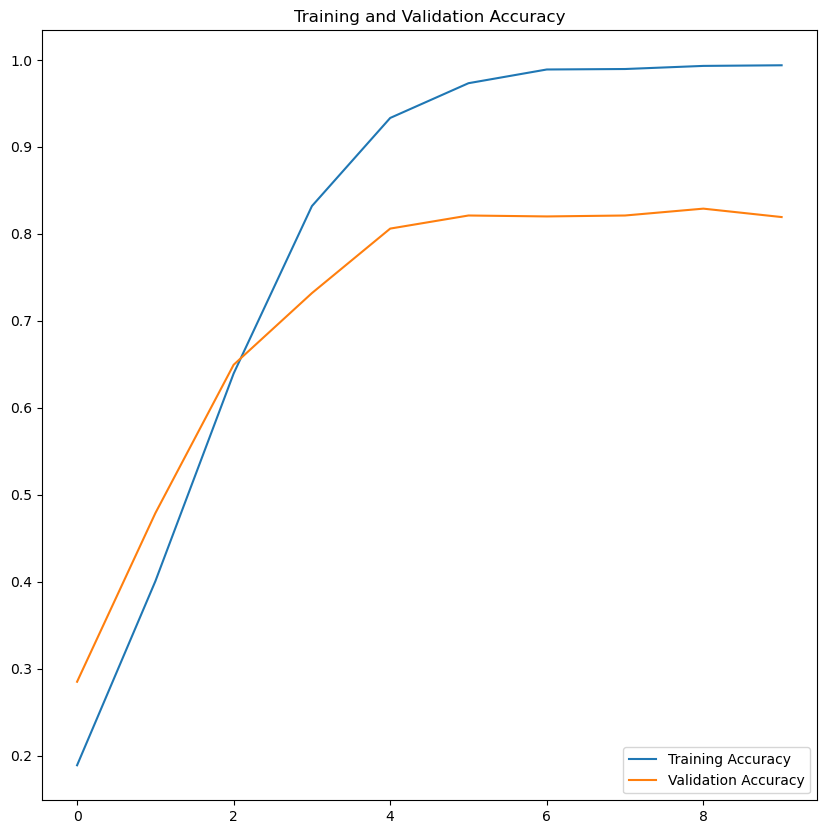

In [139]:
#visualize model performance

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#loss = history.history['loss']
#val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#plt.subplot(1, 2, 2)
#plt.plot(epochs_range, loss, label='Training Loss')
#plt.plot(epochs_range, val_loss, label='Validation Loss')
#plt.legend(loc='upper right')
#plt.title('Training and Validation Loss')
#plt.show()

## Observations

Baseline model performs with a 99% training accuracy and an 81% testing accuracy after 10 epochs. The model is overfit. 

# Assess Overfitting

Will take steps to reduce overfittign through the addition of data augmentation and drop out layers.

**Data Augmentation** - Transforms existing image data. Allows the model to process more variation and generalize better in the testing phase.

**Dropout** - Randomly reduces the contribution of some neurons in a layer. Helps to regularize the data and reduce overfitting.

In [140]:
# creates an augmentation sequence that can be used on a single example to create new variations

data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [143]:
#Recreate the model with drop out and augmentation (augmentation parameter defined above)

model = Sequential([
  data_augmentation, # added in augmentaion here
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2), #included drop out layer here (20%)
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

In [144]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [145]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

In [146]:
epochs = 10

history = model.fit(   
  train_set,            
  validation_data=test_set, 
  epochs=epochs            
)

Epoch 1/10
349/349 [==============================] - 112s 313ms/step - loss: 2.6135 - accuracy: 0.1996 - val_loss: 2.4675 - val_accuracy: 0.2566
Epoch 2/10
349/349 [==============================] - 108s 309ms/step - loss: 2.2866 - accuracy: 0.3010 - val_loss: 2.1944 - val_accuracy: 0.3305
Epoch 3/10
349/349 [==============================] - 109s 311ms/step - loss: 2.0813 - accuracy: 0.3667 - val_loss: 2.3308 - val_accuracy: 0.3391
Epoch 4/10
349/349 [==============================] - 110s 315ms/step - loss: 1.8998 - accuracy: 0.4229 - val_loss: 1.9187 - val_accuracy: 0.4272
Epoch 5/10
349/349 [==============================] - 109s 313ms/step - loss: 1.7309 - accuracy: 0.4724 - val_loss: 1.8485 - val_accuracy: 0.4513
Epoch 6/10
349/349 [==============================] - 109s 312ms/step - loss: 1.6014 - accuracy: 0.5142 - val_loss: 1.8968 - val_accuracy: 0.4559
Epoch 7/10
349/349 [==============================] - 108s 310ms/step - loss: 1.4796 - accuracy: 0.5494 - val_loss: 1.7293 -

Text(0.5, 1.0, 'Training and Validation Accuracy')

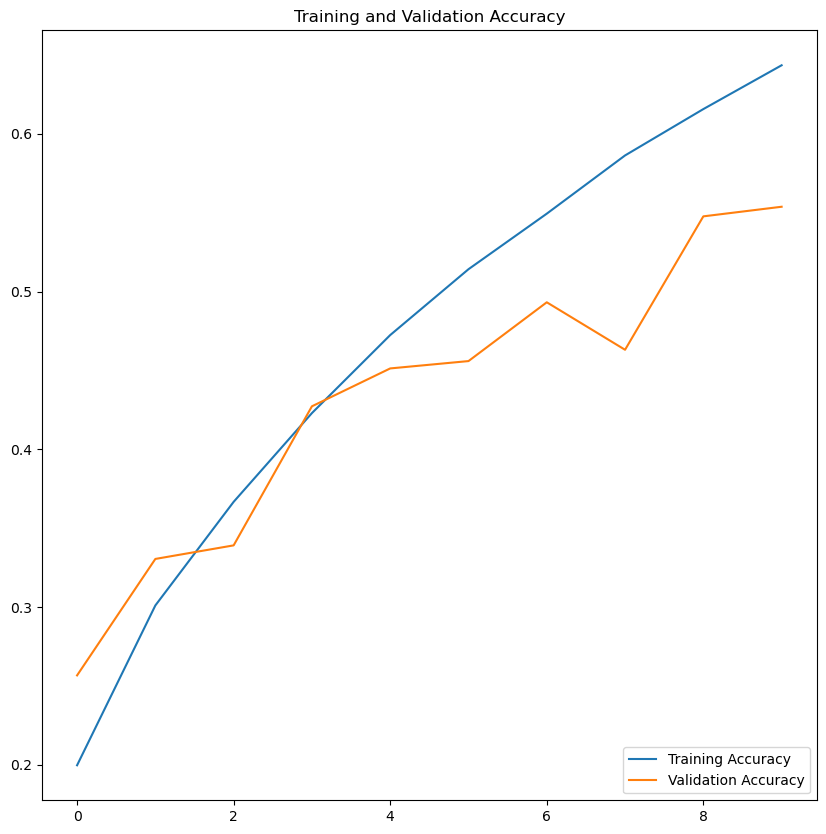

In [147]:
#visualize model performance

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#loss = history.history['loss']
#val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#plt.subplot(1, 2, 2)
#plt.plot(epochs_range, loss, label='Training Loss')
#plt.plot(epochs_range, val_loss, label='Validation Loss')
#plt.legend(loc='upper right')
#plt.title('Training and Validation Loss')
#plt.show()